In [2]:
#Import necessary libraries
import os
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt



In [3]:
def calculate_and_save_adjacency_matrices(end_dates, data_dir = './data/processed/correlation matrix', thresholds = [0.5,0.4,0.6], is_srd = False):
    for threshold in thresholds:
        adj_mat_subfolder = f"threshold-{threshold}"
        adj_mat_path = f'{data_dir}/adjacency_matrices/{adj_mat_subfolder}'
        cor_mat_path = f'{data_dir}'

        if not os.path.exists(adj_mat_path):
            os.makedirs(adj_mat_path, exist_ok=True)

        for end_date in end_dates:
            corr_df = pd.read_csv(f'{cor_mat_path}/{end_date}.csv')
            
            # Convert all columns (except index) to numeric, errors='coerce' will convert non-numeric values to NaN
            corr_df = corr_df.apply(pd.to_numeric, errors='coerce')
            
            # Replace NaN with 0 to avoid comparison issues

            corr_df = corr_df.fillna(0)

            adjacency_matrix = np.where(corr_df.values >= threshold, 1, 0)

            corr_df.iloc[:, :] = adjacency_matrix
            
            corr_df.to_csv(f'./data/processed/adjacency_matrices/threshold-{threshold}/{end_date}.csv')
            corr_df.to_pickle(f'./data/processed/adjacency_matrices/threshold-{threshold}/{end_date}.pkl')


In [10]:
def create_graph(end_dates, data_dir=f'../construct_network/data/processed/adjacency_matrices/threshold-0.5'):
    for end_date in end_dates:
        # Read the adjacency matrix
        adj_matrix = pd.read_pickle(f'{data_dir}/{end_date}.pkl')
    
        # Create a graph from the adjacency matrix
        G = nx.from_pandas_adjacency(adj_matrix)

        # Draw the graph
        plt.figure(figsize=(16, 12))  # Increased figure size
        pos = nx.spring_layout(G, k=0.5, iterations=50)  # Increased k value and iterations
        nx.draw(G, pos, with_labels=True, node_color='lightblue', 
                node_size=500, font_size=10, font_weight='bold', edge_color='b',
                alpha=0.7)  # Increased node size and font size, added transparency
    
        # Set title as the filename (date)
        plt.title(f"Graph for {end_date}", fontsize=16)
    
        # Save the graph
        plt.savefig(f'../Graphics_output/nodes/{end_date}.png', dpi=300, bbox_inches='tight')
        plt.close()  # Close the figure to free up memory

In [5]:
gt_df = pd.read_csv('../construct_network/data/processed/gt.csv', parse_dates=['date'])
dates = gt_df['date'].dt.date
del gt_df

window_width = 30

selection_index_array = [(index, index + window_width) for index in range(len(dates) - window_width)]
end_dates = [dates[index] for (_, index) in selection_index_array]
len(end_dates)

336

C:\Users\Cheska Hung\AppData\Local\Temp\ipykernel_39392\3283571200.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 8))


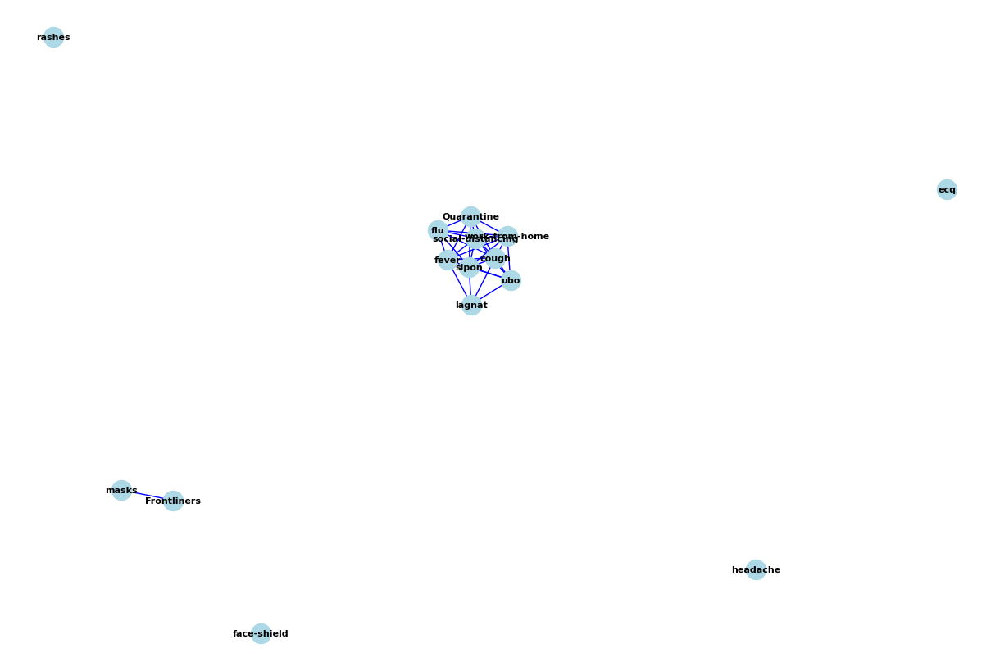

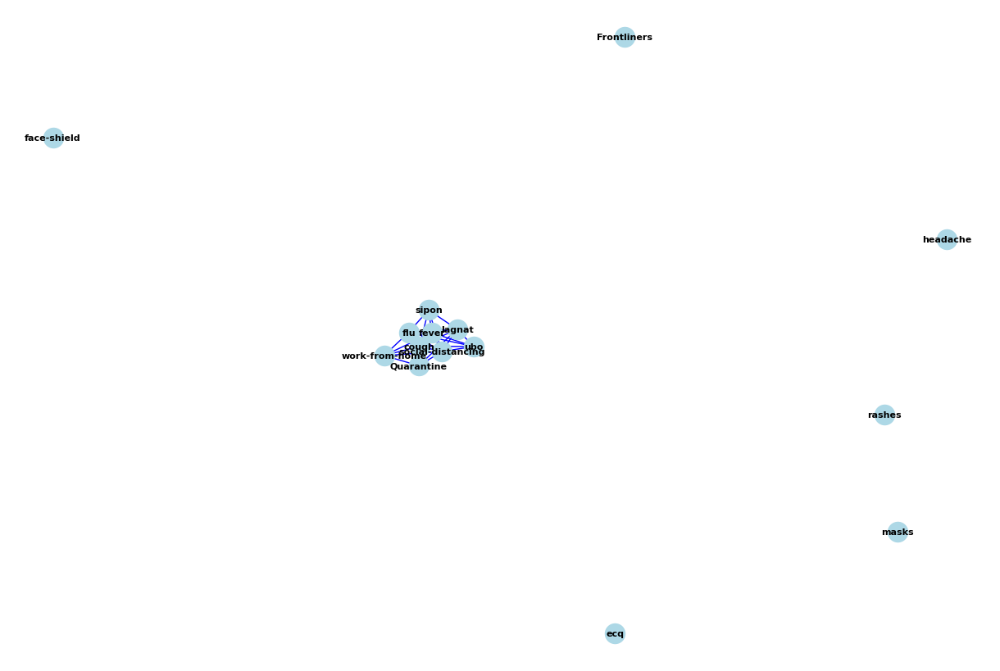

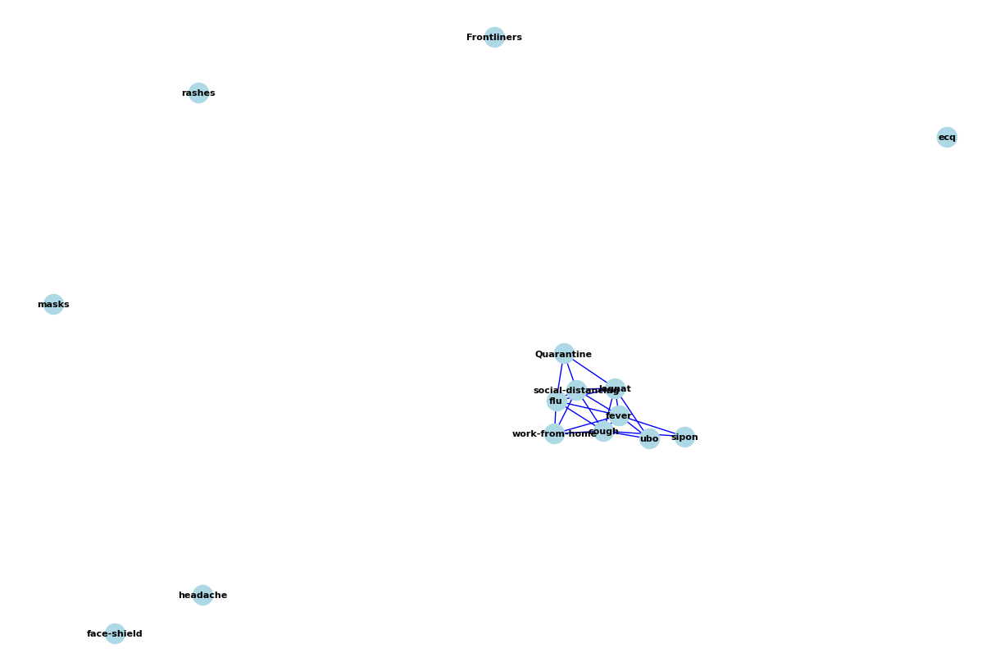

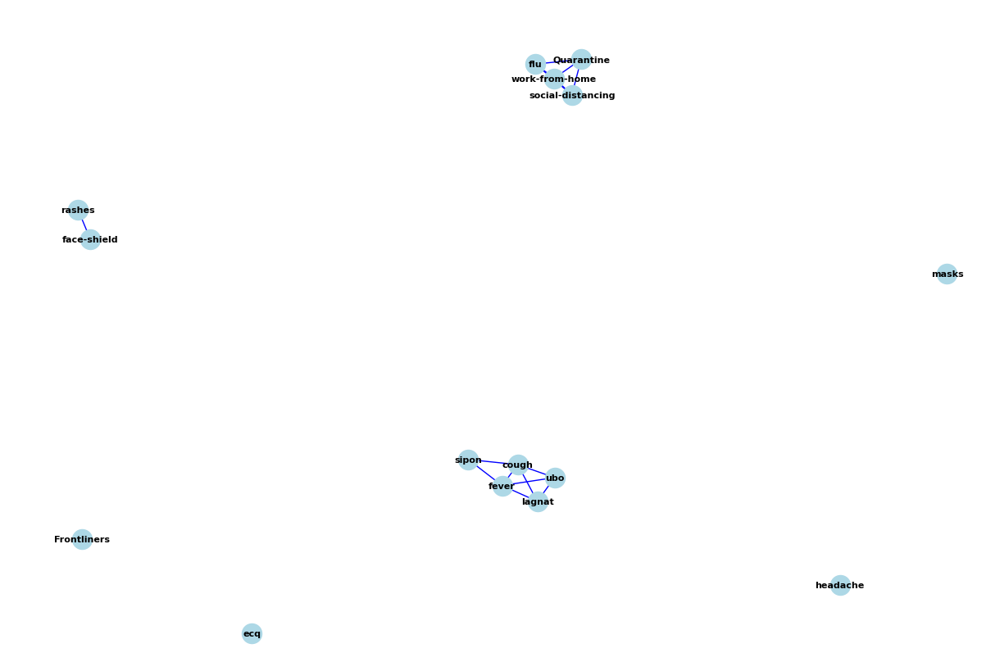

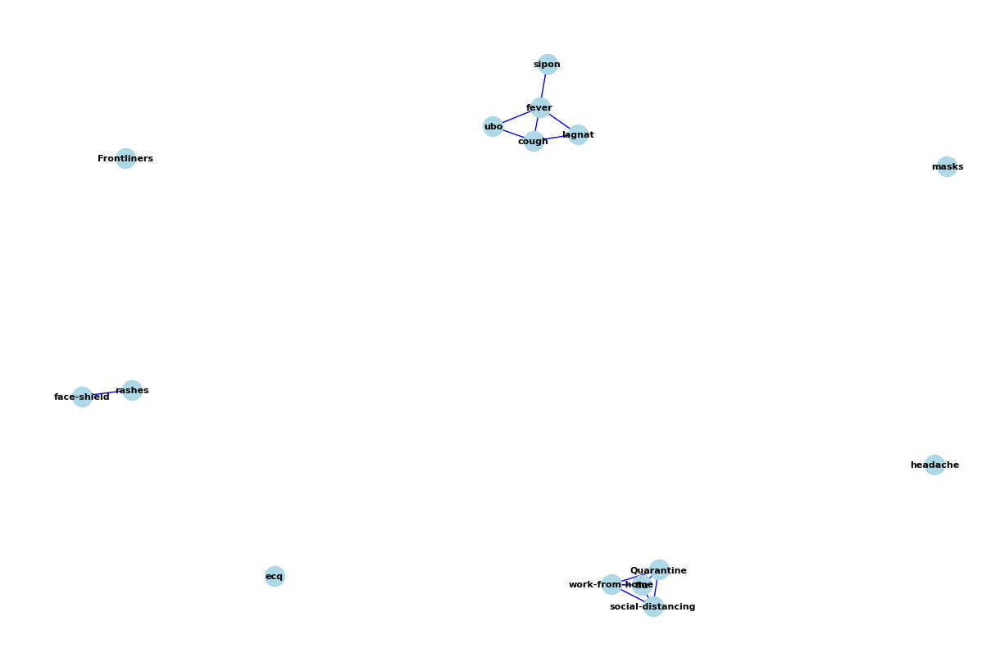

...

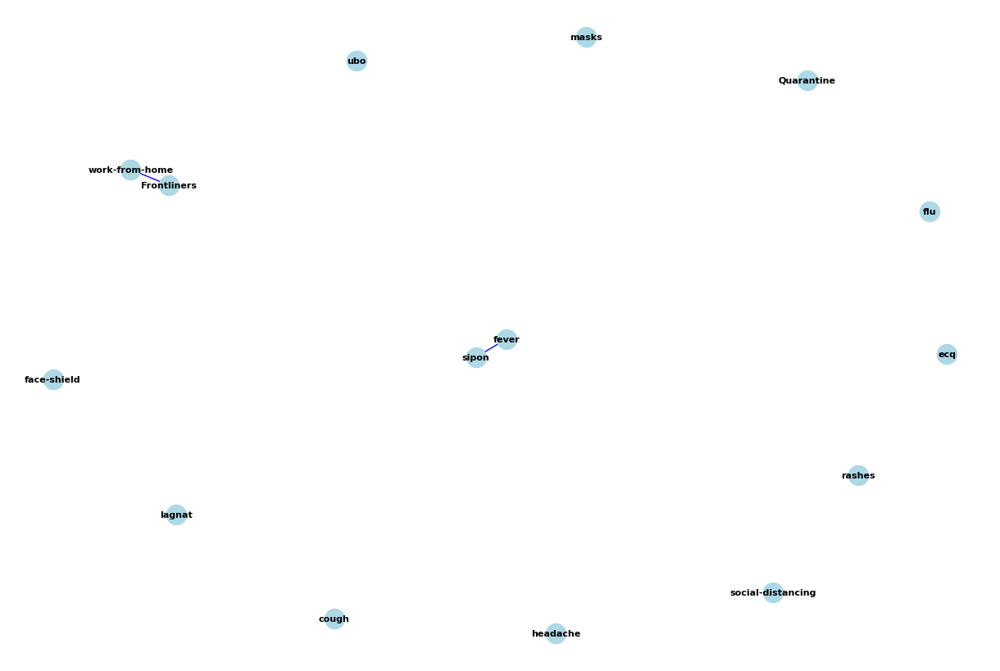

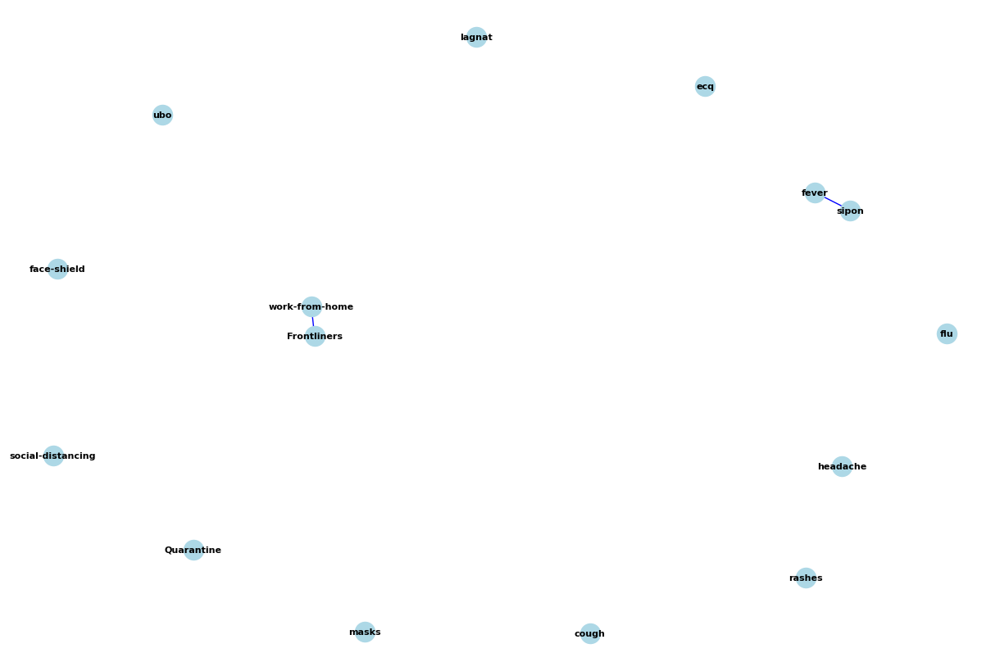

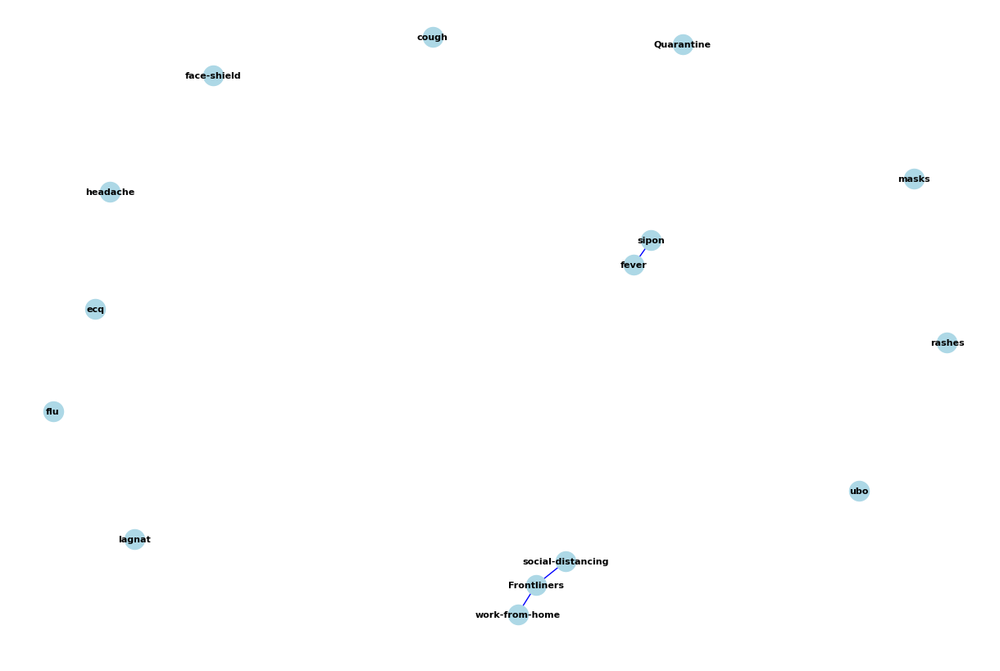

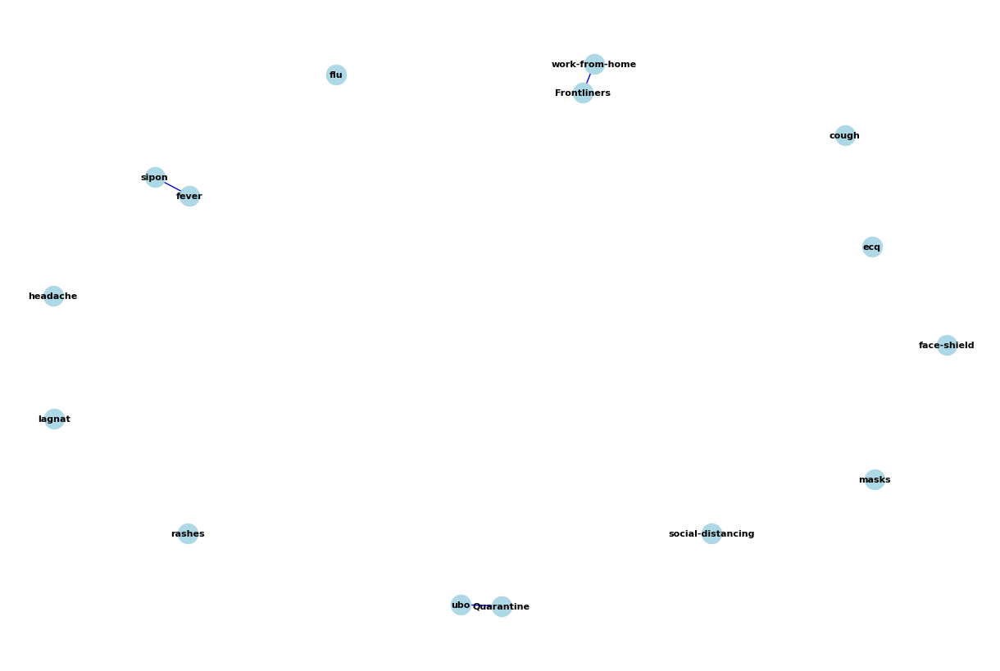

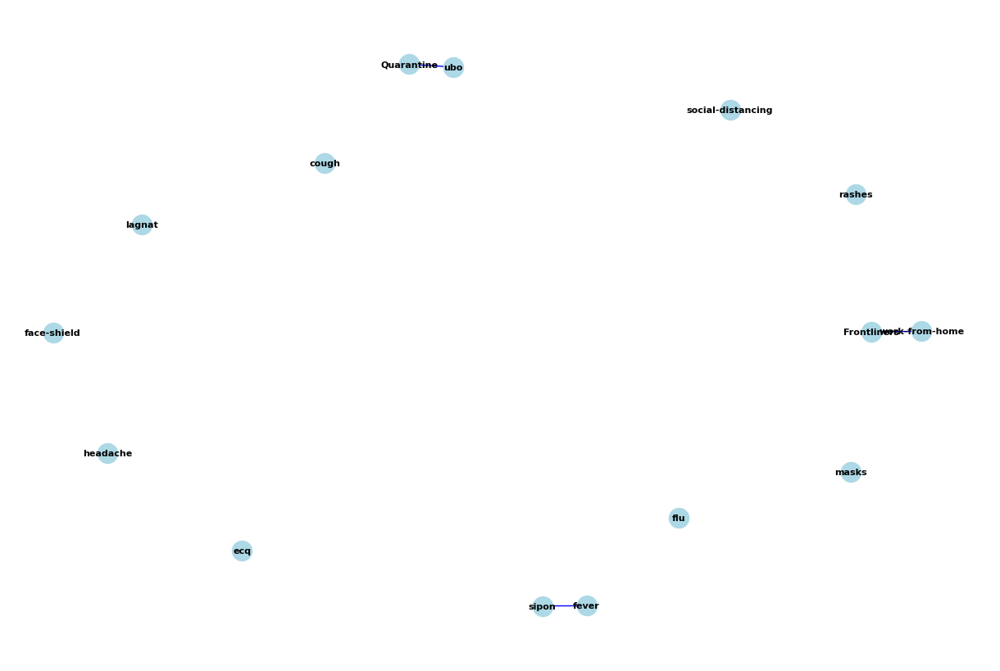

In [11]:


# Set up directories
# Create output directory if it doesn't exist


# Define function to create and save graph


# Process each file in the directory
create_graph(end_dates=end_dates)